In [1]:
# !unzip -q "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"


# 🐶 End-to-End Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

Link: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

Link: www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data
* We're dealing with images (Unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels)
* Tere are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

# Get our workspace ready

* Import Tensorflow
* Import Tensorflow Hub
* Make sure we're using a GPU

### If GPU is not available, follow the pro tip step to make the GPU available
⚡ Pro tip: In Colab → Runtime > Change runtime type > Hardware accelerator → pick GPU (and choose A100 if available).

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")


TF version: 2.19.0
Hub version: 0.16.1
GPU available


# Getting our data ready (turning into Tensors)

With all machine learning, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

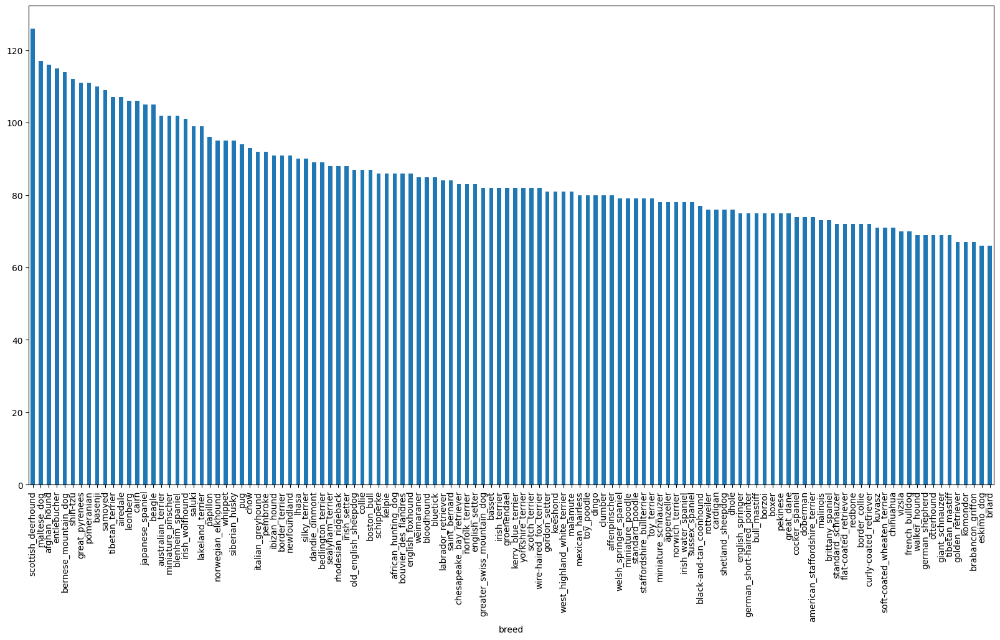

In [5]:
# Let's valualise it

labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [6]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

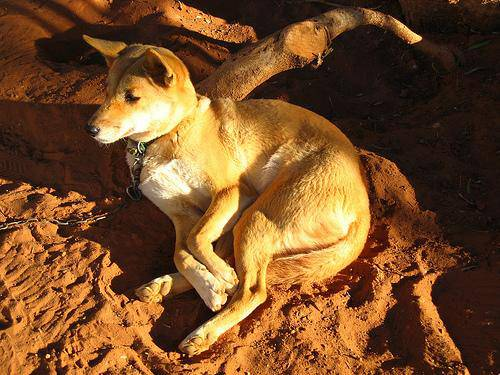

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

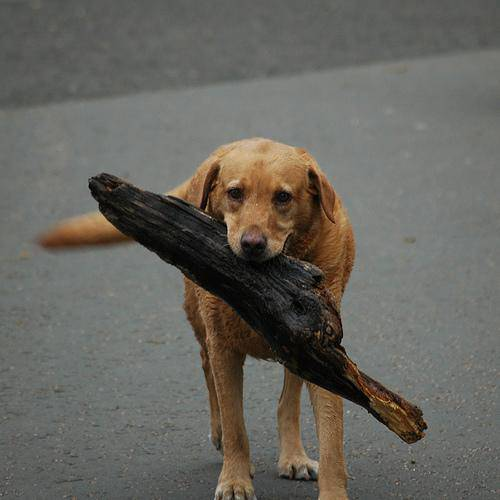

In [8]:
Image("drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

# Getting images and their labels

Let's get a list of all of our images file pathnames.

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from image ID's
filenames = [fname for fname in labels_csv["id"].values]
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in filenames]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether number of filenames matches number of actual images files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


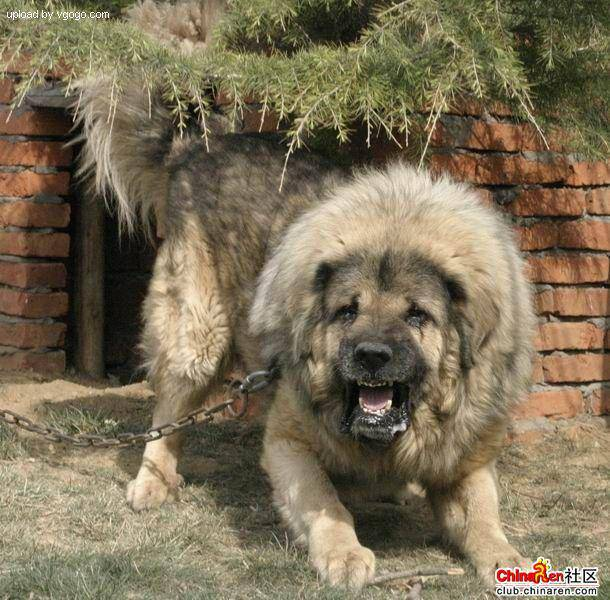

In [12]:
# One more check
Image(filenames[9000])


In [13]:
labels_csv["breed"][9000], filenames[9000]

('tibetan_mastiff',
 'drive/MyDrive/Dog Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg')

## Since we've now got our training image filepaths in a list, let's prepare our labels.

In [14]:
# Let's check our labels
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
# Check the length of labels
len(labels)

10222

In [16]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data import.")

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [18]:
# Check length of unique labels values
len(unique_breeds)

120

In [19]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [20]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
# Check length of boolean_labels
len(boolean_labels)

10222

# Turning boolean array into integers

In [22]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
# Check for labels 2
print(labels[2]) # original label
print(np.where(unique_breeds == labels[2])) # index where label occurs
print(boolean_labels[2].argmax()) # index where label occurs in boolean array
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs

pekinese
(array([85]),)
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own validation set

Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [24]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [25]:
# Check length of filenames and boolean_labels
len(filenames), len(boolean_labels)

(10222, 10222)

We're going to start off experimenting with apprix 1000 images and increase as needed

In [26]:
# Set number of images to use for experimentating
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [27]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [28]:
# Let's have a look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

# Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, "image"
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

Before we do, let's see what importing an image looks like

In [29]:
# Convert (turn) image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # choose any image
image.shape

(257, 350, 3)

In [30]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [31]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [32]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, "image"
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224, 224)
6. Return the modified image


In [33]:
# Define image size
IMG_SIZE = 224 #@param {type:"slider",min:128,max:512,step:64}

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensors with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go.. they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuple which look like this:
`(image, label)`.

In [34]:
# Create a simple function to return a tuple (image, label) as tensors
def get_image_label(image_path, label):
    """
    Takes an image file path name and the associated label,
    processes the image and returns a tuple of (image, label).
    """
    image = process_image(image_path)
    return image, label

In [35]:
# Demo of the above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

## Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [36]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the data is a test dataset, we probably don't have labels
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                   tf.constant(y))) # labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        # If the data is a training dataset, we shuffle it
        print("Creating training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                   tf.constant(y))) # labels

        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(X))

        # Create (image, label) tuples (this also turns the image path into a preprocessed image)
        data = data.map(get_image_label)

        # Turn the data into batches
        data_batch = data.batch(BATCH_SIZE)
    return data_batch



In [37]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [38]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to comprehend /understand, let's visualize them!

In [39]:
# Create a function for viewing images in a data batch
import matplotlib.pyplot as plt
def show_25_images(images, labels):
    """
    Displays 25 images from a data batch.
    """
    # Setup the figure
    plt.figure(figsize=(10, 10))
    # Loop through 25 (for displaying 25 images)
    for i in range(25):
        # Create subplots (5 rows, 5 columns)
        ax = plt.subplot(5, 5, i+1)
        # Display an image
        plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        # Turn gird lines off
        plt.axis("off")

In [40]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

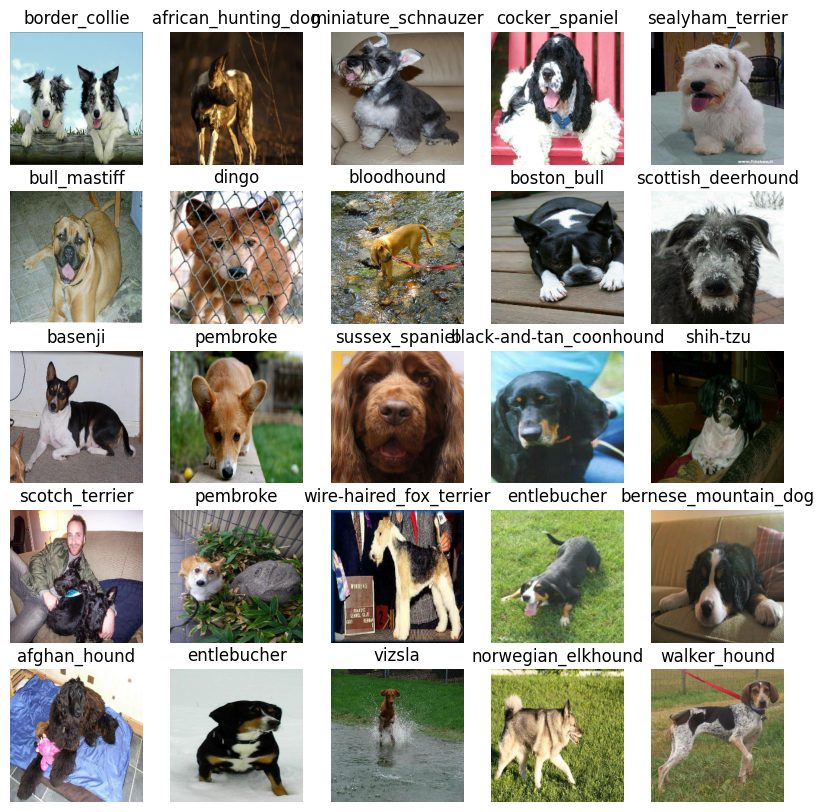

In [41]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [42]:
len(train_images), len(train_labels)

(32, 32)

It is 32 because the batch size is 32

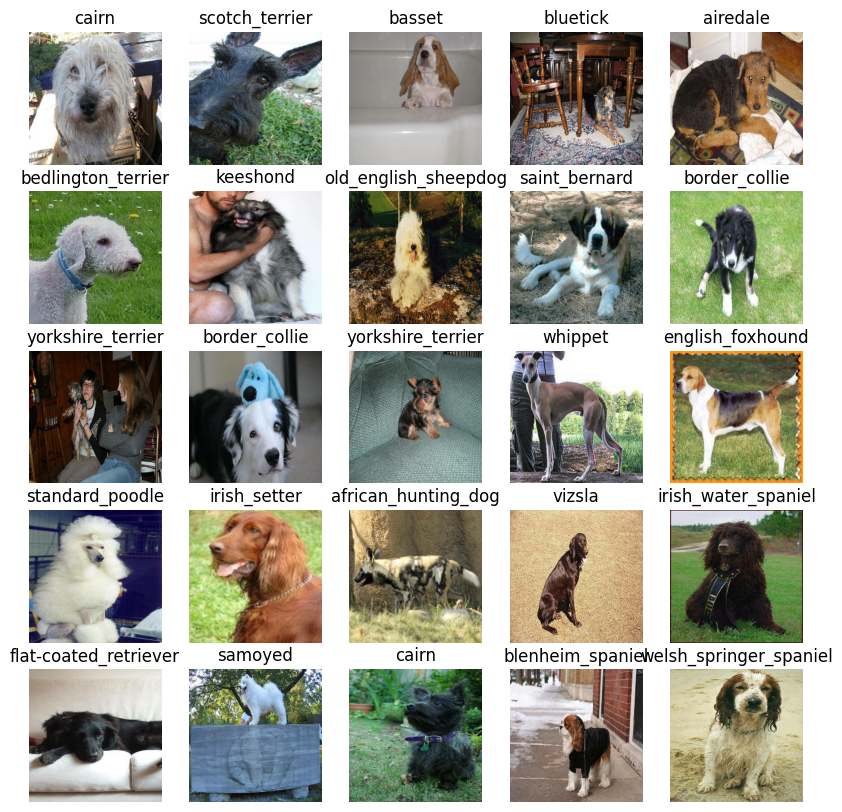

In [43]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [44]:
len(val_images), len(val_labels)

(32, 32)

# Building a deep learning model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (our labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [45]:
import tensorflow as tf, tensorflow_hub as hub
print("TensorFlow:", tf.__version__)
print("TensorFlow Hub:", hub.__version__)


TensorFlow: 2.19.0
TensorFlow Hub: 0.16.1


## Register the hub_wrapper function

In [46]:
from keras.saving import register_keras_serializable

# Parameters
IMG_SIZE = 224
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5"

# Load the TF Hub module once
hub_module = hub.load(MODEL_URL)

@register_keras_serializable()
def hub_wrapper(x):
    """Wrapper to call hub module inside Keras Lambda."""
    return hub_module(x)


In [47]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE):
    print("Building model with:", MODEL_URL)

    # Input
    inputs = tf.keras.Input(shape=input_shape)

    # Feature extractor (Lambda layer with registered hub_wrapper)
    x = tf.keras.layers.Lambda(hub_wrapper, name="feature_extractor")(inputs)

    # Dense classifier
    outputs = tf.keras.layers.Dense(units=output_shape, activation="softmax")(x)

    # Build model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    return model


In [48]:
# Create and summarize
model = create_model()
model.summary()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ feature_extractor (Lambda)      │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       199,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 199,800 (780.47 KB)

 Trainable params: 199,800 (780.47 KB)

 Non-trainable params: 0 (0.00 B)

# Creating callback

Callback are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models fit() function.
3. Visualize our models training logs with the %tensorBoard magic function (we'll do this after model training).

In [49]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [50]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                          # Make it so the logs get tracked whenever we run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Earl stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [51]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a deep learning neural network model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [52]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [53]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


### Let's create a function which trains a model

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callboard()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use.
* Return the model

In [54]:
# Build a function to train and return a trained model
def train_model():
  """
  Train a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model



In [55]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 425s 16s/step - accuracy: 0.0770 - loss: 4.6729 - val_accuracy: 0.3700 - val_loss: 3.1839
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.7289 - loss: 1.7251 - val_accuracy: 0.5650 - val_loss: 1.8644
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.9598 - loss: 0.5807 - val_accuracy: 0.6300 - val_loss: 1.4828
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - accuracy: 0.9953 - loss: 0.2662 - val_accuracy: 0.6650 - val_loss: 1.3510
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9978 - loss: 0.1579 - val_accuracy: 0.6700 - val_loss: 1.2737
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9988 - loss: 0.1191 - val_accuracy: 0.6700 - val_loss: 1.2414
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 1.0000 - loss: 0.0887 - val_accuracy: 0.6850 - val_loss: 1.1988
Epoch 8/10

### **Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

Note: Overfitting to begin with is a good thing! It means our model is learning!!!

## Checking the TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [56]:
%tensorboard --logdir "/content/drive/MyDrive/Dog Vision/logs"

Output hidden; open in https://colab.research.google.com to view.

# Make and Transform Predictions

## Making and Evaluating predictions using a trained model

In [57]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [58]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long each epoch takes
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 701ms/step


array([[8.99855397e-04, 2.60178840e-05, 2.36112464e-04, ...,
        5.12264160e-05, 2.12154209e-05, 4.95894020e-03],
       [4.20293165e-03, 4.62958502e-04, 4.09262888e-02, ...,
        2.01386167e-04, 6.97224226e-04, 1.51853703e-04],
       [9.20922503e-06, 9.88534011e-05, 6.26779365e-05, ...,
        3.67742643e-04, 1.49533225e-05, 1.04292412e-03],
       ...,
       [1.46951052e-05, 4.64772420e-05, 1.26757630e-04, ...,
        1.84030396e-05, 7.90781778e-05, 4.90719140e-05],
       [6.34128042e-03, 2.20875809e-04, 2.62424262e-04, ...,
        2.82166555e-04, 5.12848565e-05, 1.03465617e-02],
       [2.55634863e-04, 3.58377110e-05, 1.45009370e-03, ...,
        4.08838550e-03, 4.66861267e-04, 1.28028056e-04]], dtype=float32)

In [59]:
predictions[0] # predictions for first image

array([8.99855397e-04, 2.60178840e-05, 2.36112464e-04, 6.39974314e-05,
       2.47348653e-04, 1.46203092e-06, 1.43808005e-02, 3.49818547e-05,
       7.17382791e-05, 1.43988742e-04, 1.52987530e-04, 2.03749059e-05,
       2.84460148e-05, 2.73363385e-05, 4.13298578e-04, 1.01202502e-04,
       1.15289286e-05, 5.00379503e-01, 1.55674006e-05, 5.79949756e-06,
       1.94448745e-04, 4.53692010e-05, 8.68297684e-06, 5.96976955e-04,
       2.62072954e-05, 1.77305792e-05, 1.42879620e-01, 3.38334139e-05,
       9.95579991e-04, 3.81969759e-04, 7.37218725e-05, 3.22343578e-04,
       1.13727532e-04, 9.22119852e-06, 1.81313255e-04, 1.28708305e-02,
       2.23828356e-05, 1.47313665e-04, 8.56193674e-06, 5.47620402e-05,
       3.33803648e-04, 9.33267256e-06, 2.32765960e-05, 9.31668274e-06,
       3.82468425e-05, 7.30471857e-06, 2.00893082e-05, 4.16180337e-05,
       2.33784900e-04, 8.13425359e-05, 1.09151415e-05, 5.57414605e-05,
       1.13356672e-03, 4.53012126e-06, 1.08136028e-05, 2.27581786e-05,
      

In [60]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {predictions[index].max()}")
print(f"Sum: {predictions[index].sum()}")
print(f"Max index: {predictions[index].argmax()}")
print(f"Predicted label: {unique_breeds[predictions[index].argmax()]}")
print(f"Image shape: {val_images[index].shape}")
print(f"Number of predictions: {len(predictions[index])}")

[8.99855397e-04 2.60178840e-05 2.36112464e-04 6.39974314e-05
 2.47348653e-04 1.46203092e-06 1.43808005e-02 3.49818547e-05
 7.17382791e-05 1.43988742e-04 1.52987530e-04 2.03749059e-05
 2.84460148e-05 2.73363385e-05 4.13298578e-04 1.01202502e-04
 1.15289286e-05 5.00379503e-01 1.55674006e-05 5.79949756e-06
 1.94448745e-04 4.53692010e-05 8.68297684e-06 5.96976955e-04
 2.62072954e-05 1.77305792e-05 1.42879620e-01 3.38334139e-05
 9.95579991e-04 3.81969759e-04 7.37218725e-05 3.22343578e-04
 1.13727532e-04 9.22119852e-06 1.81313255e-04 1.28708305e-02
 2.23828356e-05 1.47313665e-04 8.56193674e-06 5.47620402e-05
 3.33803648e-04 9.33267256e-06 2.32765960e-05 9.31668274e-06
 3.82468425e-05 7.30471857e-06 2.00893082e-05 4.16180337e-05
 2.33784900e-04 8.13425359e-05 1.09151415e-05 5.57414605e-05
 1.13356672e-03 4.53012126e-06 1.08136028e-05 2.27581786e-05
 2.94475649e-05 3.22969770e-03 1.21326542e-04 9.48674902e-02
 1.10854067e-04 3.78814934e-06 5.60775341e-04 2.84858106e-05
 1.99751041e-04 3.080094

In [61]:
unique_breeds[17]

'border_terrier'

In [62]:
# Fiveth prediction
index = 4
print(predictions[index])
print(f"Max value (probability of prediction): {predictions[index].max()}")
print(f"Sum: {predictions[index].sum()}")
print(f"Max index: {predictions[index].argmax()}")
print(f"Predicted label: {unique_breeds[predictions[index].argmax()]}")
print(f"Image shape: {val_images[index].shape}")
print(f"Number of predictions: {len(predictions[index])}")

[4.36287119e-05 1.12994196e-04 7.05155544e-05 9.31331933e-01
 7.76481920e-06 2.32086401e-04 5.56408835e-04 1.75933077e-04
 6.71331509e-05 9.72076214e-06 4.45845013e-04 3.53088893e-04
 2.28595920e-04 2.09584141e-05 2.01017509e-04 7.92844949e-05
 7.07731442e-06 1.68115145e-03 2.58461987e-05 6.20185403e-07
 3.39981707e-05 8.31690704e-06 1.93640371e-05 7.65275545e-05
 2.85103451e-05 4.80143342e-07 4.73335695e-06 7.77175737e-05
 1.97046320e-03 1.05196596e-04 6.60501319e-05 4.03923696e-06
 1.17796226e-05 2.96215385e-05 1.53448185e-04 4.71173735e-05
 4.01827856e-04 3.39984806e-04 1.88766091e-04 1.21104567e-04
 6.21834488e-06 8.12670635e-07 6.12057556e-05 1.54756362e-05
 1.77651111e-06 2.67376151e-07 6.22988446e-04 8.11306654e-06
 4.55707013e-05 4.46704071e-05 6.41939696e-04 7.17451985e-06
 1.53659930e-04 1.69218110e-05 1.53748260e-05 3.33566004e-06
 2.01009461e-04 1.54094193e-02 1.46870689e-05 3.76947748e-04
 6.17556652e-05 7.13928685e-08 1.59554402e-05 3.50317896e-05
 5.66259951e-05 1.714398

In [63]:
unique_breeds[3]

'airedale'

# Transform Predictions To Text

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilities are also known as CONFIDENCE LEVELS.

In [64]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """
    return unique_breeds[prediction_probabilities.argmax()] # Returns the predicted label (easier to understand)

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0]) # You can change the prediction label
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [65]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [66]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays
    of images and labels.
    """

    image = []
    labels = []
    # Loop through unbatched data
    for image_batch, labels_batch in data.unbatch().as_numpy_iterator():
        # Add the image and label separately to the lists
        image.append(image_batch)
        labels.append(unique_breeds[labels_batch.argmax()])
    return image, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

# Visualizing And Evaluate model Predictions 1

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Take an array of prediction probabilities, an array of truth labels and an array of images and an integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [67]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth label and image for sample n.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title(f"Pred: {pred_label} ({pred_prob[pred_prob.argmax()]:.2f})\nActual: {true_label}\nColor: {color}")
    plt.show()

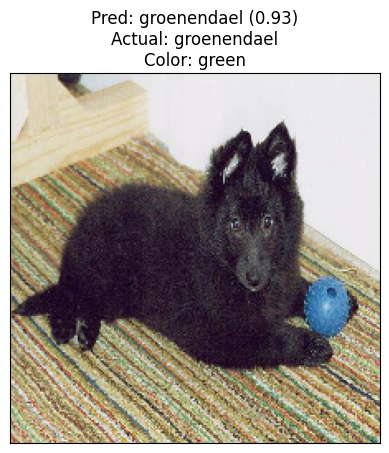

In [68]:
plot_pred(predictions, val_labels, val_images, n=77) # Always change the value of n


# Visualizing and Evaluate Model Predictions 2

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an inputof prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10 prediction probablity values and labels, coloring the true label green.

In [69]:
def plot_pred_with_conf(prediction_probabilities, labels, images, n=0):
    """
    Displays an image alongside the top 10 prediction confidences (in %).
    Highlights the true label in green if present, else highlights predicted in red.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
    pred_label = get_pred_label(pred_prob)

    # Top 10 predictions
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes] * 100  # convert to %
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Confidence of the top predicted class
    top_pred_conf = np.max(pred_prob) * 100

    # --- Setup figure with 1 row, 2 columns ---
    fig, (ax_img, ax_bar) = plt.subplots(1, 2, figsize=(12, 6))

    # Show image
    ax_img.imshow(image)
    ax_img.set_title(
        f"**Pred: {pred_label} ({top_pred_conf:.1f}%) | Truth: {true_label}**",
        fontweight="bold"
    )
    ax_img.axis("off")

    # Bar chart for top 10 predictions
    bars = ax_bar.bar(np.arange(len(top_10_pred_labels)),
                      top_10_pred_values,
                      color="grey")
    ax_bar.set_xticks(np.arange(len(top_10_pred_labels)))
    ax_bar.set_xticklabels(top_10_pred_labels, rotation="vertical")
    ax_bar.set_ylabel("Probability (%)")

    # Highlight correct/incorrect
    if np.isin(true_label, top_10_pred_labels):
        bars[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        bars[0].set_color("red")

    plt.tight_layout()
    plt.show()


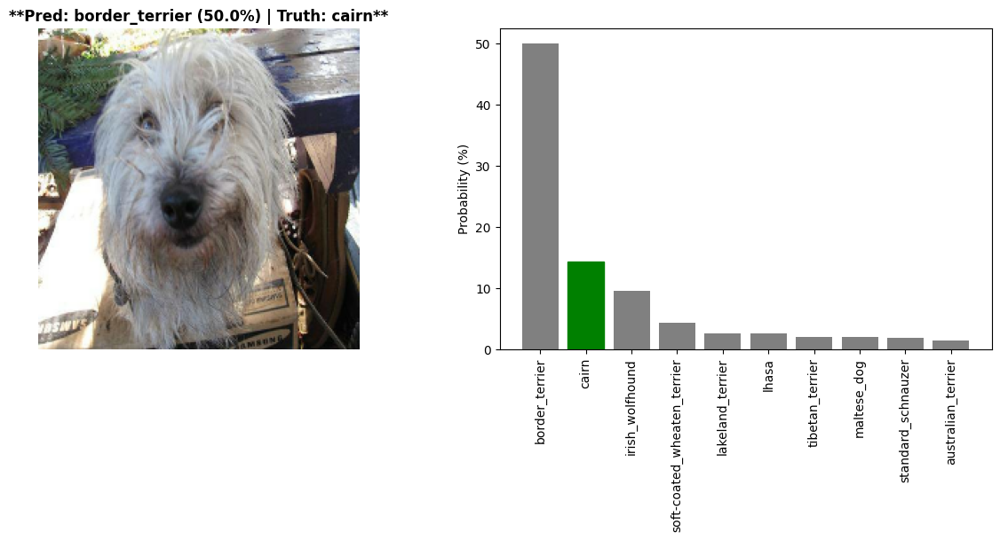

In [70]:
# Example usage of plot_pred_with_conf

# Pick index 0 (first image)
plot_pred_with_conf(prediction_probabilities=predictions,
                    labels=val_labels,
                    images=val_images,
                    n=0)

# Pick index 15 (16th image)
#plot_pred_with_conf(prediction_probabilities=predictions,
                    #labels=val_labels,
                    #images=val_images,
                    #n=15)


# Visualizing and Evaluate Model Predictions 3

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

In [71]:
def plot_predictions_batch(predictions, val_labels, val_images, i_multiplier=0, num_rows=3, num_cols=2):
    """
    Plots multiple images and their top 10 predictions in a grid.

    Args:
        predictions: model prediction probabilities
        val_labels: true labels
        val_images: images to display
        i_multiplier: starting index in the dataset
        num_rows: number of rows in the grid
        num_cols: number of columns in the grid
    """
    num_images = num_rows * num_cols
    plt.figure(figsize=(6*num_cols*2, 6*num_rows))  # width scaled for side-by-side

    for i in range(num_images):
        n = i + i_multiplier

        # Display image
        plt.subplot(num_rows, 2*num_cols, 2*i+1)
        plt.imshow(val_images[n])

        # Get top prediction and its probability (%)
        top_pred_idx = predictions[n].argmax()
        top_pred_label = get_pred_label(predictions[n])
        top_pred_prob = predictions[n][top_pred_idx] * 100  # in %

        plt.title(f"**Pred: {top_pred_label} ({top_pred_prob:.1f}%) | Truth: {val_labels[n]}**",
                  fontweight="bold")
        plt.axis("off")

        # Display bar plot of top 10 predictions
        plt.subplot(num_rows, 2*num_cols, 2*i+2)
        pred_prob = predictions[n]
        top_10_idx = pred_prob.argsort()[-10:][::-1]
        top_10_values = pred_prob[top_10_idx] * 100  # convert to %
        top_10_labels = unique_breeds[top_10_idx]

        bars = plt.bar(np.arange(len(top_10_labels)), top_10_values, color="grey")
        plt.xticks(np.arange(len(top_10_labels)), top_10_labels, rotation="vertical")
        plt.ylabel("Probability (%)")

        # Highlight correct/incorrect
        true_label = val_labels[n]
        if np.isin(true_label, top_10_labels):
            bars[np.argmax(top_10_labels == true_label)].set_color("green")
        else:
            bars[0].set_color("red")

    plt.tight_layout(h_pad=1.0)
    plt.show()

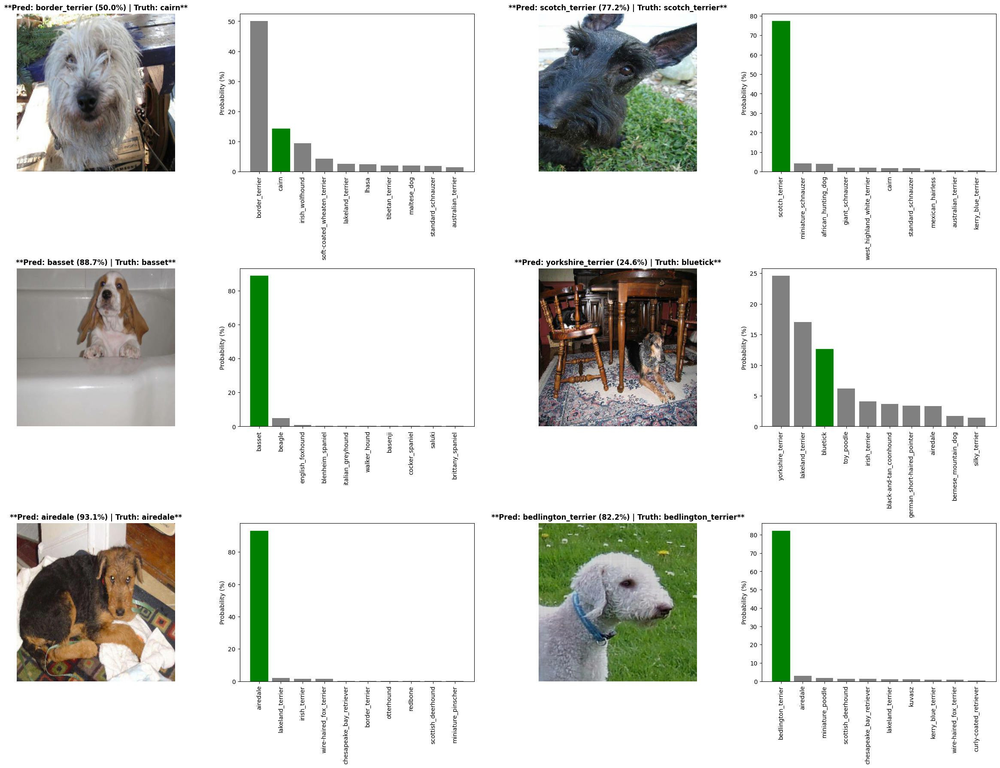

In [72]:
# Example usage
# Starting from index 0, display 6 images (3 rows x 2 cols)
plot_predictions_batch(predictions, val_labels, val_images, i_multiplier=0, num_rows=3, num_cols=2)

# To see the next batch, just change i_multiplier
#plot_predictions_batch(predictions, val_labels, val_images, i_multiplier=6, num_rows=3, num_cols=2)


# Saving and Loading a Trained Model

In [73]:
# Save the model (use .keras for native Keras format)
import os, datetime

def save_model(model, suffix=None):
    modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    os.makedirs(modeldir, exist_ok=True)
    model_path = os.path.join(modeldir, f"model-{suffix}.keras")
    print(f"Saving model to: {model_path} ...")
    model.save(model_path)
    return model_path

def load_model(model_path):
    print(f"Loading model from: {model_path} ...")
    return tf.keras.models.load_model(model_path, custom_objects={"hub_wrapper": hub_wrapper})

In [74]:
## Save the trained model
model_path = save_model(model, suffix="1000-images-Adam")

# Load the model
loaded_1000_image_model = load_model(model_path)

# Confirm the loaded model
loaded_1000_image_model.summary()


Saving model to: drive/MyDrive/Dog Vision/models/20250910-121149/model-1000-images-Adam.keras ...
Loading model from: drive/MyDrive/Dog Vision/models/20250910-121149/model-1000-images-Adam.keras ...


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ feature_extractor (Lambda)      │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 120)            │       199,800 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 599,402 (2.29 MB)

 Trainable params: 199,800 (780.47 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 399,602 (1.52 MB)

In [75]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.6921 - loss: 1.0947


[1.1519367694854736, 0.6850000023841858]

In [76]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 634ms/step - accuracy: 0.6921 - loss: 1.0947


[1.1519367694854736, 0.6850000023841858]

# Training Model on full Dataset

In [77]:
len(X), len(y) # X is the filenames & y is the labels

(10222, 10222)

In [78]:
# Let's check 10 ot it
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [79]:
len(X_train), len(y_train)

(800, 800)

In [80]:
X_train[:10]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

## Create a data batch with full dataset

In [81]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [82]:
# Create a model for full data model
full_model = create_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/5


In [83]:
# Create full model callbacks
tensorboard_callback = create_tensorboard_callback()
checkpoint_callback = tf

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [84]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[tensorboard_callback,
                          full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 110ms/step - accuracy: 0.5167 - loss: 2.1981
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - accuracy: 0.8886 - loss: 0.3879
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - accuracy: 0.9461 - loss: 0.2227
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - accuracy: 0.9751 - loss: 0.1429
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - accuracy: 0.9886 - loss: 0.0958
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - accuracy: 0.9941 - loss: 0.0692
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - accuracy: 0.9978 - loss: 0.0497
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - accuracy: 0.9984 - loss: 0.0393
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 14s 43ms/step - accuracy: 0.9988 - loss: 0.0305
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - accuracy: 0.9995 - loss: 0.0246
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - accuracy: 0.9990 - loss: 0.0213
Epoch 12/100
320/3

In [85]:
# Save the full full model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20250910-121602/model-full-image-set-mobilenetv2-Adam.keras ...


'drive/MyDrive/Dog Vision/models/20250910-121602/model-full-image-set-mobilenetv2-Adam.keras'

In [88]:
# Load in the full model
load_full_model = load_model("drive/MyDrive/Dog Vision/models/20250910-121602/model-full-image-set-mobilenetv2-Adam.keras")

Loading model from: drive/MyDrive/Dog Vision/models/20250910-121602/model-full-image-set-mobilenetv2-Adam.keras ...


# Making Predictions On Test Images (Test Dataset)

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the Test data, we'll

* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [89]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/deec27ba9446dfe31c0b32586f175d6a.jpg',
 'drive/MyDrive/Dog Vision/test/e37d651b9b5fdcf26ab37259fac877d1.jpg',
 'drive/MyDrive/Dog Vision/test/e610bd621c660546f7cd1cd6554a5caf.jpg',
 'drive/MyDrive/Dog Vision/test/e48e4d9137c69e69f54f85907c061172.jpg',
 'drive/MyDrive/Dog Vision/test/e5b14b20ee8ac070bf5cea3b640f3dde.jpg',
 'drive/MyDrive/Dog Vision/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg',
 'drive/MyDrive/Dog Vision/test/e65bf4e655ccf594210174f124e3adf0.jpg',
 'drive/MyDrive/Dog Vision/test/dfe02d52ca281aaca6215a42fee6245c.jpg',
 'drive/MyDrive/Dog Vision/test/e1f4d57ee24b11a0d1a24b83e12d6bb7.jpg',
 'drive/MyDrive/Dog Vision/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg']

In [90]:
len(test_filenames)

10357

In [91]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)
test_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [92]:
# Make predictions on test data batch using the loaded full model
test_predictions = load_full_model.predict(test_data,
                                           verbose=1)
test_predictions

# 324 is got by len(test_filenames) / 32

324/324 ━━━━━━━━━━━━━━━━━━━━ 425s 1s/step


array([[9.64305635e-10, 9.73524283e-09, 4.49713422e-09, ...,
        6.85301700e-07, 1.72319298e-10, 6.69322209e-10],
       [6.67549386e-07, 7.68454911e-10, 9.55433288e-10, ...,
        1.52943986e-08, 1.88069316e-09, 4.70526356e-06],
       [2.59403055e-11, 4.24823838e-08, 6.85637602e-10, ...,
        2.73486933e-07, 1.34425690e-07, 8.55460425e-10],
       ...,
       [2.11302655e-08, 2.70921618e-10, 5.42734604e-08, ...,
        2.76659762e-08, 1.09457332e-08, 4.78138311e-08],
       [1.43085257e-04, 1.42218582e-07, 2.05039232e-05, ...,
        1.10843175e-04, 4.37081791e-04, 1.40561074e-08],
       [3.02547737e-10, 3.42396278e-10, 8.38157266e-10, ...,
        3.86231290e-11, 1.57418398e-10, 1.53510413e-10]], dtype=float32)

In [93]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/test_predictions.csv",
           test_predictions,
           delimiter=",")

In [94]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv",
                               delimiter=",")
test_predictions

array([[9.64305635e-10, 9.73524283e-09, 4.49713422e-09, ...,
        6.85301700e-07, 1.72319298e-10, 6.69322209e-10],
       [6.67549386e-07, 7.68454911e-10, 9.55433288e-10, ...,
        1.52943986e-08, 1.88069316e-09, 4.70526356e-06],
       [2.59403055e-11, 4.24823838e-08, 6.85637602e-10, ...,
        2.73486933e-07, 1.34425690e-07, 8.55460425e-10],
       ...,
       [2.11302655e-08, 2.70921618e-10, 5.42734604e-08, ...,
        2.76659762e-08, 1.09457332e-08, 4.78138311e-08],
       [1.43085257e-04, 1.42218582e-07, 2.05039232e-05, ...,
        1.10843175e-04, 4.37081791e-04, 1.40561074e-08],
       [3.02547737e-10, 3.42396278e-10, 8.38157266e-10, ...,
        3.86231290e-11, 1.57418398e-10, 1.53510413e-10]])

In [95]:
# Let's look at first 10
test_predictions[:10]

array([[9.64305635e-10, 9.73524283e-09, 4.49713422e-09, ...,
        6.85301700e-07, 1.72319298e-10, 6.69322209e-10],
       [6.67549386e-07, 7.68454911e-10, 9.55433288e-10, ...,
        1.52943986e-08, 1.88069316e-09, 4.70526356e-06],
       [2.59403055e-11, 4.24823838e-08, 6.85637602e-10, ...,
        2.73486933e-07, 1.34425690e-07, 8.55460425e-10],
       ...,
       [2.04204252e-06, 2.68008726e-09, 4.66502126e-09, ...,
        2.39119284e-08, 1.10612348e-07, 5.33635216e-07],
       [9.28802649e-07, 2.71630753e-08, 5.96717291e-06, ...,
        2.16069784e-05, 9.28538328e-04, 8.11972768e-06],
       [8.46581624e-11, 3.37103900e-09, 2.29797972e-10, ...,
        6.02224520e-11, 1.16249436e-12, 5.20028812e-12]])

In [96]:
# Let's check the test predictions shape
test_predictions.shape

(10357, 120)

# Making Predictions On Our Images (Customs Images)

To make predictions on custom images, we'll

* Get the filepaths of our own images
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [97]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/richard-brutyo-Sg3XwuEpybU-unsplash.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/pexels-nancy-guth-269359-850602.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/pexels-valeriya-1805164.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/pexels-ekaterina-bolovtsova-5264086.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/pexels-pet-foto-644780685-17880514.jpg']

In [98]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [99]:
# Make predictions on the custom data
custom_preds = load_full_model.predict(custom_data)
custom_preds

1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step


array([[3.06385437e-14, 1.32746152e-07, 4.31463365e-10, 7.42472483e-09,
        5.22055732e-10, 1.58153290e-09, 1.80105186e-09, 2.94146152e-09,
        9.43737710e-09, 3.88644499e-11, 7.67415353e-10, 2.40146986e-13,
        5.20452813e-11, 6.60386024e-10, 2.82365509e-09, 2.87347079e-09,
        1.67688467e-11, 1.11768017e-09, 1.31765319e-08, 1.58110608e-11,
        2.97444307e-13, 2.12836845e-12, 9.87602500e-11, 1.99675831e-11,
        2.67828483e-07, 8.58289481e-11, 5.22047509e-11, 3.49358693e-08,
        1.39297267e-08, 2.32290245e-06, 6.24066487e-09, 1.67487579e-09,
        2.52800470e-04, 8.38156600e-10, 4.22112301e-09, 1.78747381e-11,
        1.27304203e-08, 6.41836522e-08, 2.26735401e-11, 1.24860677e-09,
        9.43065288e-08, 8.84737249e-12, 5.99508429e-11, 1.74136368e-08,
        1.58660740e-07, 5.44767749e-14, 2.35760567e-09, 1.81752571e-10,
        1.04652425e-13, 9.99016643e-01, 1.11851675e-08, 1.86488176e-08,
        1.85221225e-08, 9.53937462e-09, 2.97366333e-11, 1.217703

In [100]:
# Check the custom data shape
custom_preds.shape

(5, 120)

In [101]:
# Get custom image predictions labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'boxer', 'chow', 'pembroke', 'samoyed']

In [102]:
# Get custom images (our unbatchify() function won't work since there aren't labels.... maybe we could fix this later)
custom_images = []

# Loop through unbatched data
for image_batch in custom_data.unbatch().as_numpy_iterator():
    # Add the image
    custom_images.append(image_batch)

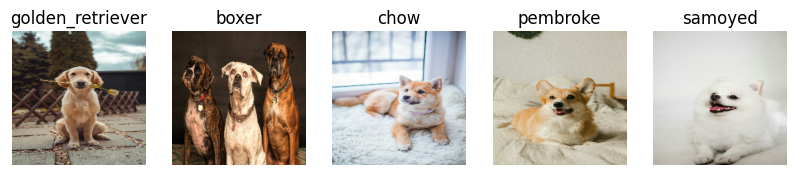

In [103]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image)
    plt.title(f"{custom_pred_labels[i]}")
    plt.axis(False)

In [104]:
!apt-get install git -q


Reading package lists...
Building dependency tree...
Reading state information...
git is already the newest version (1:2.34.1-1ubuntu1.15).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [105]:
!git config --global user.name "Petlaz"
!git config --global user.email "peter.obi96@yahoo.com"


In [106]:
!git config --global --list


user.name=Petlaz
user.email=peter.obi96@yahoo.com


In [107]:
!git clone https://github.com/Petlaz/dog-vision.git


Cloning into 'dog-vision'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 7 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (7/7), 314.31 KiB | 52.38 MiB/s, done.


# Safe GitHub Push from Colab

In [108]:
import os
import shutil
from getpass import getpass

# 1️⃣ Set your project folder and notebook paths
project_folder = "/content/dog-vision"
notebook_src = "/content/drive/MyDrive/Colab Notebooks/dog-vision.ipynb"
notebook_dest = os.path.join(project_folder, "dog-vision.ipynb")


In [109]:
# 2️⃣ Ensure project folder exists
os.makedirs(project_folder, exist_ok=True)
